In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats
from scipy.stats import mannwhitneyu
import math
import geopandas as gpd
import matplotlib.patches as mpatches

In [2]:
#US_ratings should be loaded directly from the data made in the pipeline.py

BA_merged = pd.read_csv('../../minimizedData/BA_ratings_small_plus.csv')
US_ratings = BA_merged.dropna(subset=['beer_location','user_location','rating'])
US_ratings = US_ratings[US_ratings['user_location'].str.startswith('United States,')]
US_ratings = US_ratings[US_ratings['beer_location'].str.startswith('United States,')]

US_ratings['user_state'] = US_ratings['user_location'].apply(lambda x: x.split(',')[1].strip())
US_ratings['beer_state'] = US_ratings['beer_location'].apply(lambda x: x.split(',')[1].strip())
US_ratings = US_ratings.drop(['user_location','beer_location'], axis=1)

US_ratings = US_ratings[(US_ratings['user_state'] != 'United States') & (US_ratings['beer_state'] != 'United States')]

US_ratings.head(3)

,beer_name,beer_id,brewery_name,brewery_id,style,user_id,appearance,aroma,palate,taste,overall,rating,avg,user_state,beer_state
1008809,Kupfer Kolsch,289320.0,Copper State Brewing Company,49595.0,Kölsch,n2185.211743,2.50,4.00,4.00,3.75,3.75,3.76,3.76,North Carolina,Wisconsin
1008810,Northwestern Alt,289321.0,Copper State Brewing Company,49595.0,Altbier,n2185.211743,3.00,3.75,4.00,3.50,3.50,3.58,3.58,North Carolina,Wisconsin
1008811,One Cent Wheat,289319.0,Copper State Brewing Company,49595.0,Witbier,n2185.211743,3.75,3.25,3.75,3.50,3.50,3.48,3.48,North Carolina,Wisconsin


In [3]:
#csv file containing all the states and their neighbouring states
#empty list for states that have no neighbours (e.g Alazka, Hawaii)
neighbours_df = pd.read_csv('../../additionalData/bordering_states.csv', dtype={'state':'string', 
                                                                          'neighbours': 'string'})
neighbours_df["neighbours"] = neighbours_df["neighbours"].fillna("").apply(lambda x: x.split(";") if x else [])

neighbours_df.head(3)

,state,neighbours,nb_neighbours
0,Alabama,"[Florida, Georgia, Mississippi, Tennessee]",4
1,Alaska,[],0
2,Arizona,"[California, Colorado, Nevada, New Mexico, Utah]",5


In [4]:
def gather_region_ratings(state, US_ratings, neighbours_df):
    neighbours = neighbours_df.loc[neighbours_df['state'] == state, 'neighbours'].values[0]
    
    region_states = [state] + neighbours    
    region_ratings = US_ratings[US_ratings['beer_state'].isin(region_states)]

    in_region_ratings = region_ratings[region_ratings['user_state'].isin(region_states)]
    not_in_region_ratings = region_ratings[~region_ratings['user_state'].isin(region_states)]
    
    return in_region_ratings, not_in_region_ratings

states = US_ratings['beer_state'].unique()

all_ratings = {'region': [], 'rating': [], 'rating_type': [], 'user_state': []}

for state in states:
    in_region, non_region = gather_region_ratings(state, US_ratings, neighbours_df)

    region_name = f"{state}"
    
    # Add In-Region ratings to the dictionary
    all_ratings['region'].extend([region_name] * len(in_region))
    all_ratings['rating'].extend(in_region['rating'].tolist())
    all_ratings['rating_type'].extend(['In-Region'] * len(in_region))
    all_ratings['user_state'].extend(in_region['user_state'].tolist())
    
    # Add Non-Region ratings to the dictionary
    all_ratings['region'].extend([region_name] * len(non_region))
    all_ratings['rating'].extend(non_region['rating'].tolist())
    all_ratings['rating_type'].extend(['Non-Region'] * len(non_region))
    all_ratings['user_state'].extend(non_region['user_state'].tolist())

ratings_df = pd.DataFrame(all_ratings)

ratings_df.head()


,region,rating,rating_type,user_state
0,Wisconsin,4.04,In-Region,Wisconsin
1,Wisconsin,4.00,In-Region,Wisconsin
2,Wisconsin,3.75,In-Region,Wisconsin
3,Wisconsin,3.90,In-Region,Illinois
4,Wisconsin,3.25,In-Region,Wisconsin


In [5]:
ratings_df.head(200)

,region,rating,rating_type,user_state
0,Wisconsin,4.04,In-Region,Wisconsin
1,Wisconsin,4.00,In-Region,Wisconsin
2,Wisconsin,3.75,In-Region,Wisconsin
3,Wisconsin,3.90,In-Region,Illinois
4,Wisconsin,3.25,In-Region,Wisconsin
...,...,...,...,...
195,Wisconsin,3.50,In-Region,Minnesota
196,Wisconsin,4.25,In-Region,Wisconsin
197,Wisconsin,3.75,In-Region,Minnesota
198,Wisconsin,4.15,In-Region,Minnesota


In [6]:
ratings_df = ratings_df[ratings_df['rating_type'] == 'In-Region']
ratings_df = ratings_df.drop('rating_type', axis=1)
ratings_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13278808 entries, 0 to 34011603
Data columns (total 3 columns):
 #   Column      Dtype  
---  ------      -----  
 0   region      object 
 1   rating      float64
 2   user_state  object 
dtypes: float64(1), object(2)
memory usage: 405.2+ MB


In [7]:
ratings_df['rating_type'] = np.where(ratings_df['region'] == ratings_df['user_state'], 'In-State', 'Non-State')
avg_ratings = ratings_df.groupby(['region', 'rating_type'])['rating'].mean().unstack()
avg_ratings = avg_ratings.reset_index()
avg_ratings.head()


rating_type,region,In-State,Non-State
0,Alabama,3.876441,3.942452
1,Alaska,3.970084,NaN
2,Arizona,3.950191,3.971004
3,Arkansas,3.782575,3.784315
4,California,4.003972,3.970370


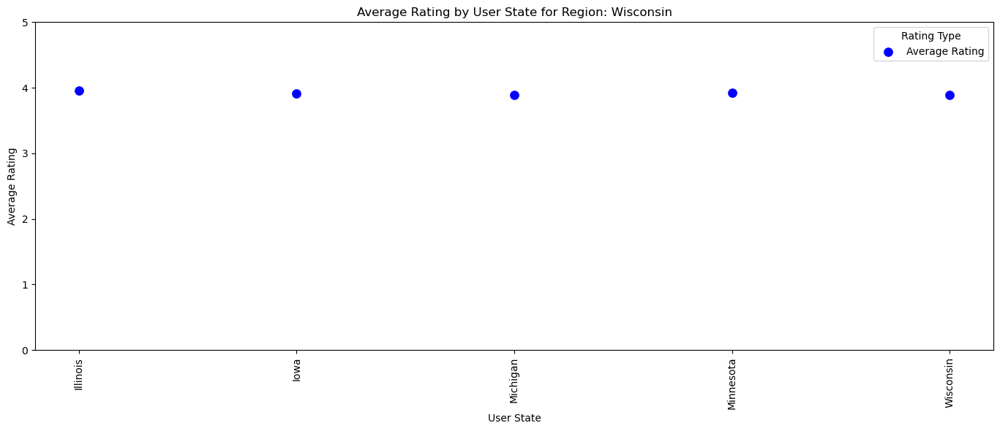

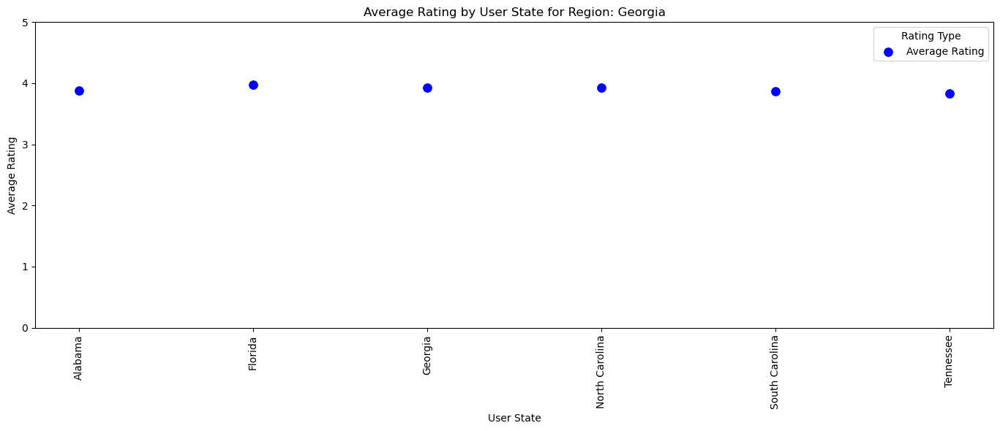

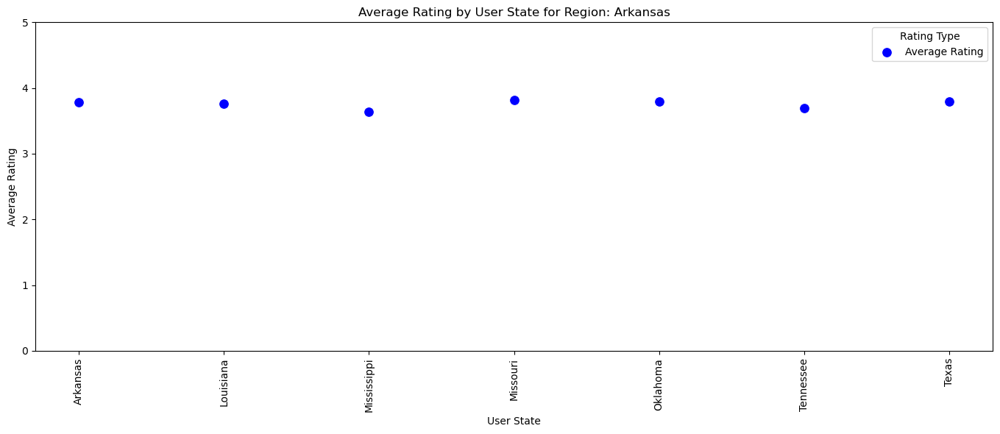

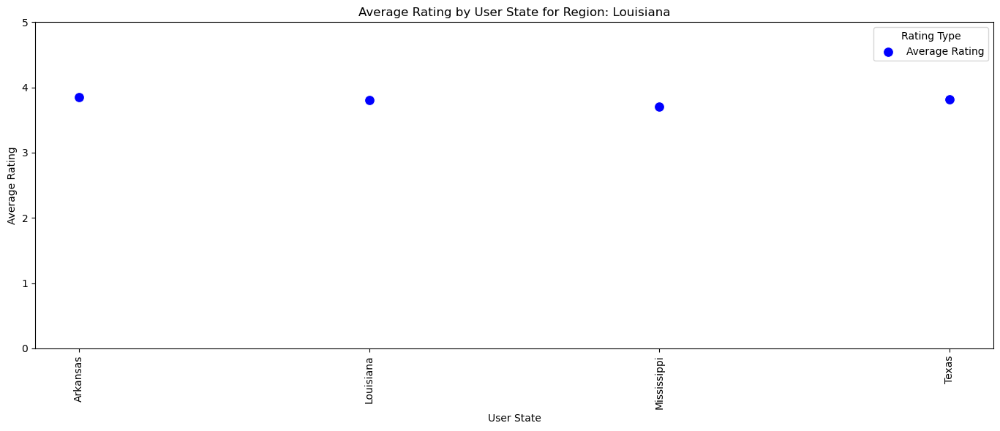

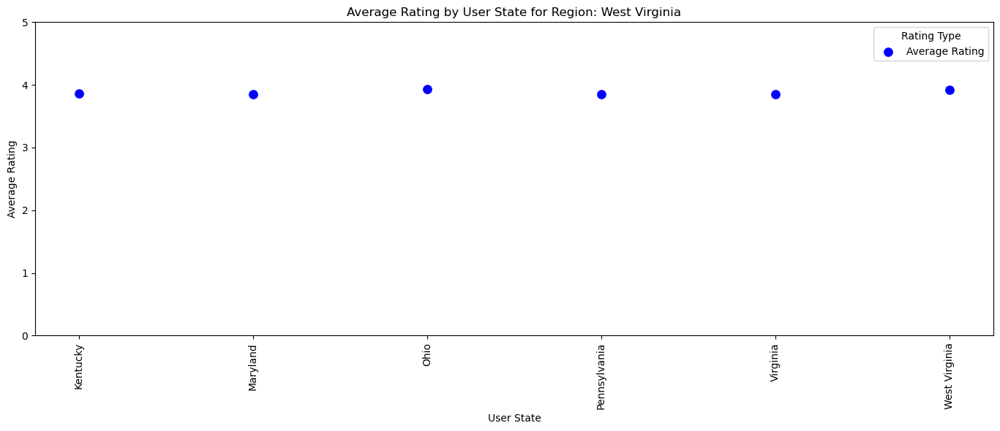

...

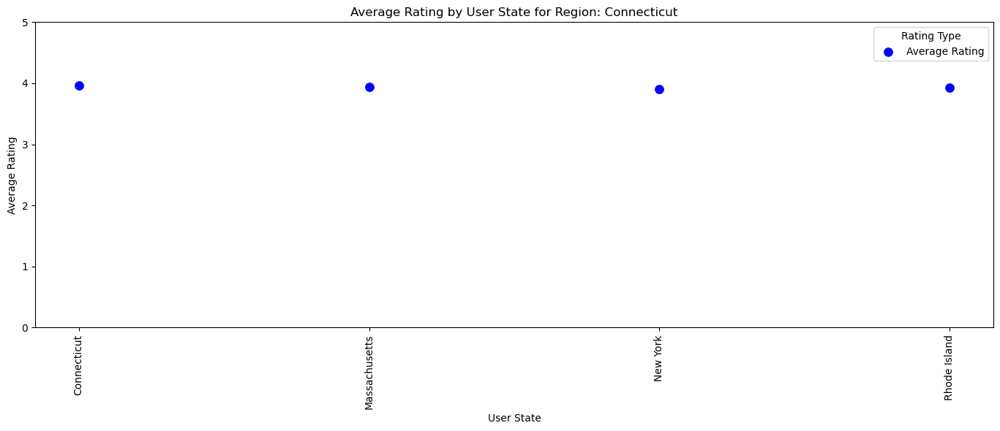

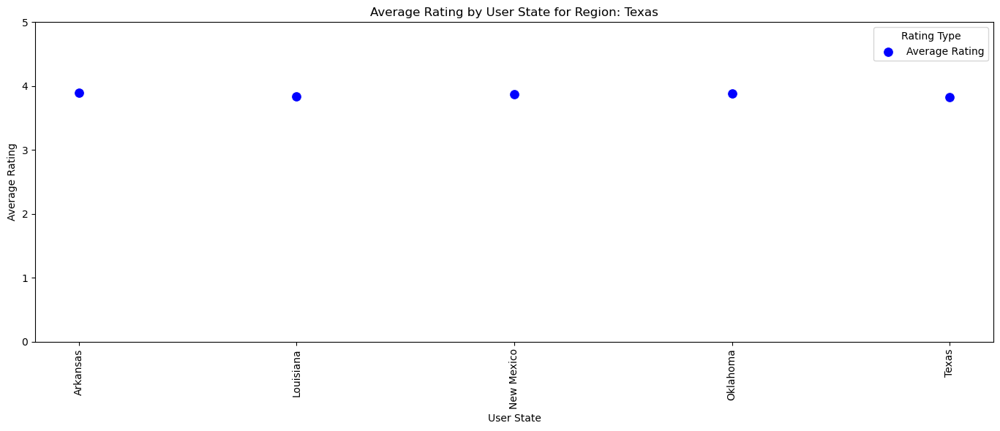

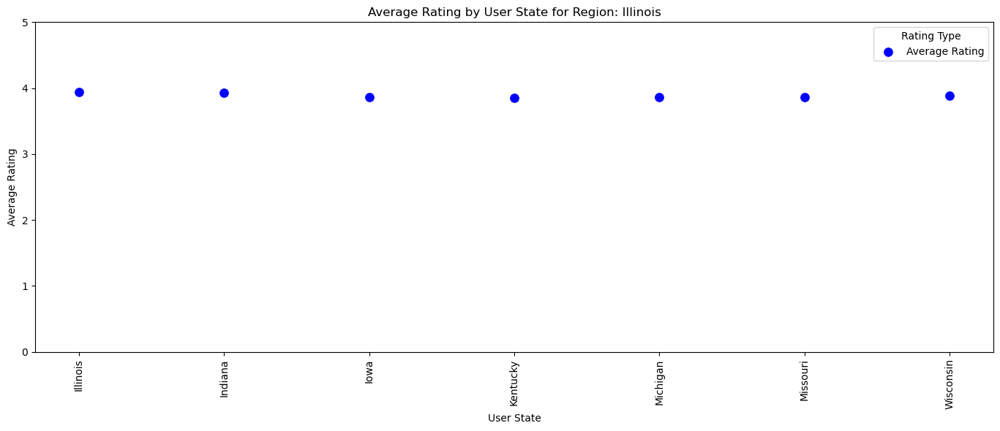

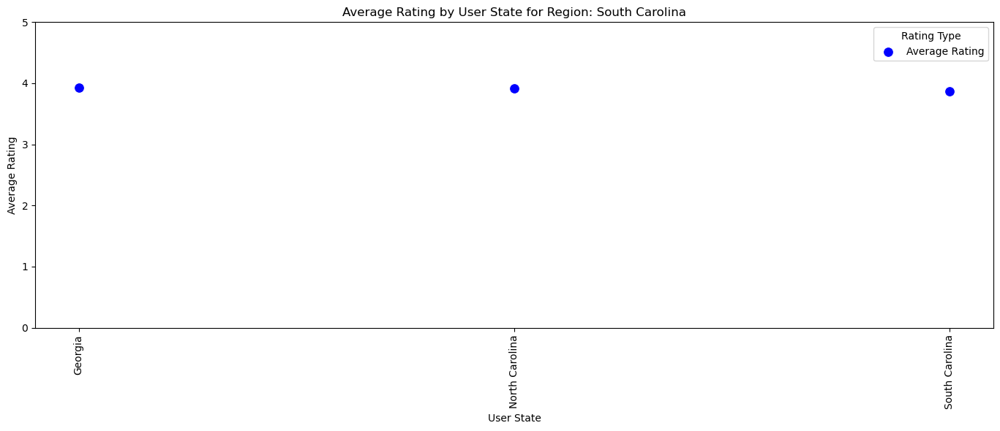

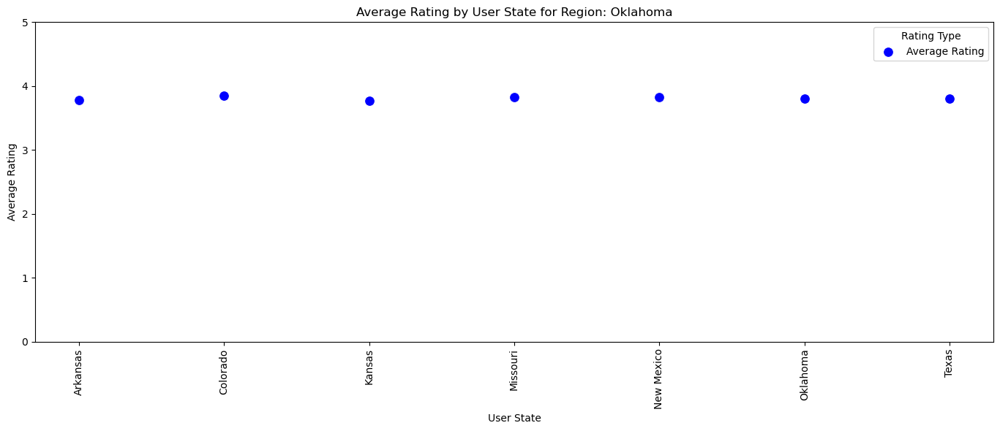

In [8]:
# Creating a scatter plot for each region displaying the average rating for each user state in region
for region in ratings_df['region'].unique():
    subset = ratings_df[ratings_df['region'] == region]
    
    avg_ratings = subset.groupby('user_state')['rating'].mean().reset_index()
    
    plt.figure(figsize=(14, 6))
    
    sns.scatterplot(data=avg_ratings, x='user_state', y='rating', color='blue', s=100, marker='o', label='Average Rating')

    plt.title(f'Average Rating by User State for Region: {region}')
    plt.xlabel('User State')
    plt.ylabel('Average Rating')
    plt.xticks(rotation=90)
    plt.legend(title='Rating Type')
    plt.tight_layout()
    plt.ylim(0,5)

    plt.show()


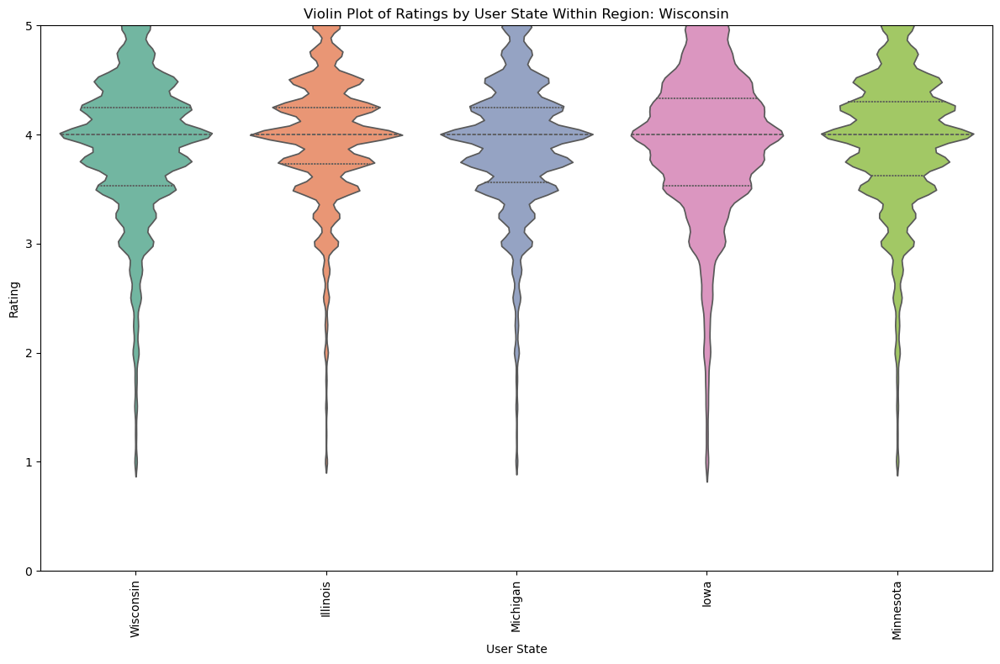

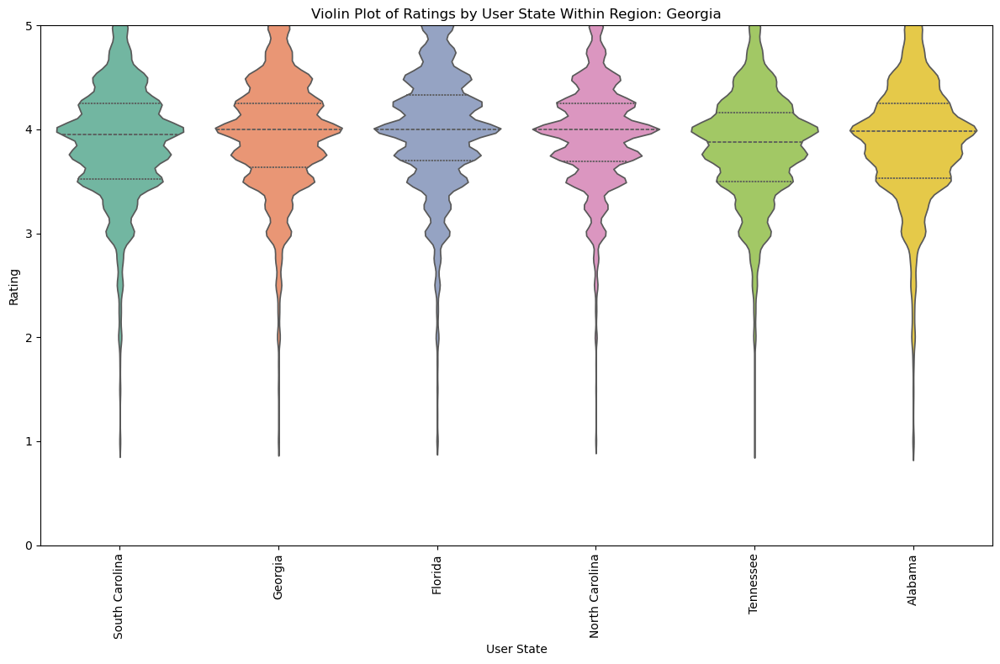

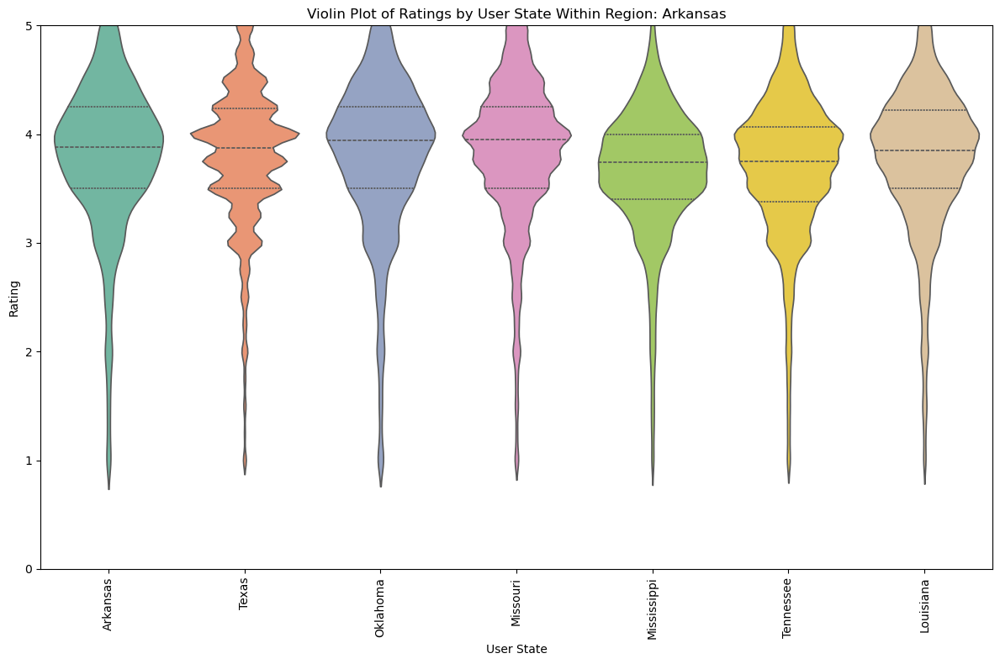

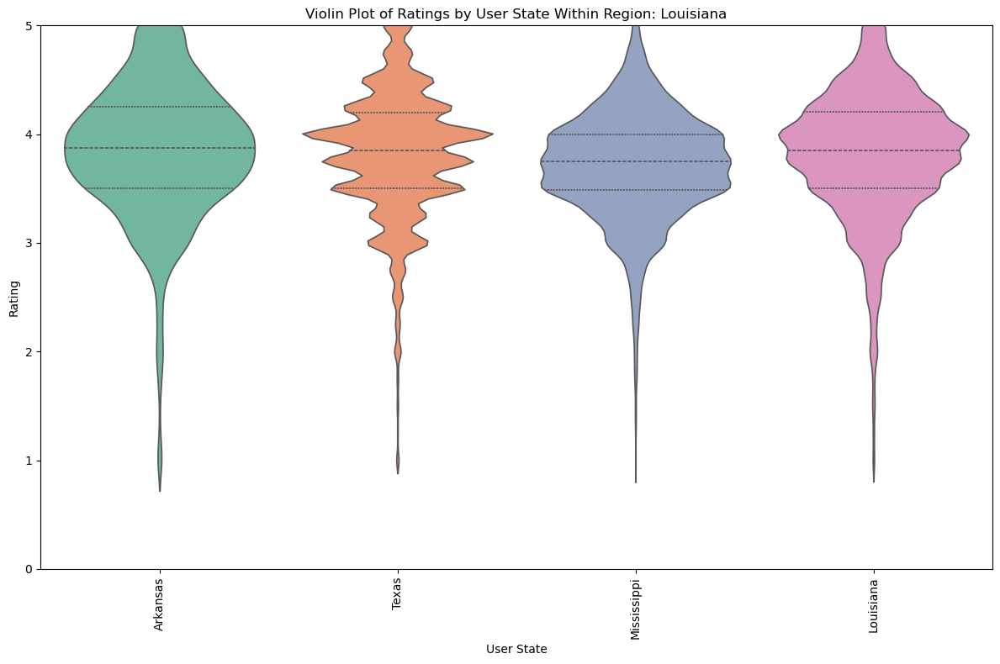

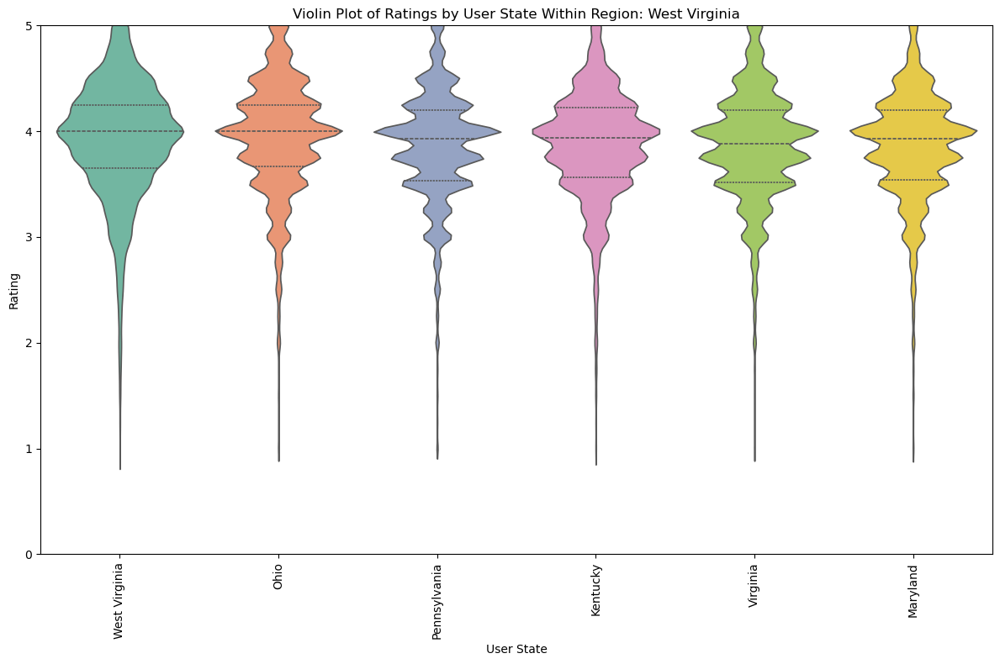

...

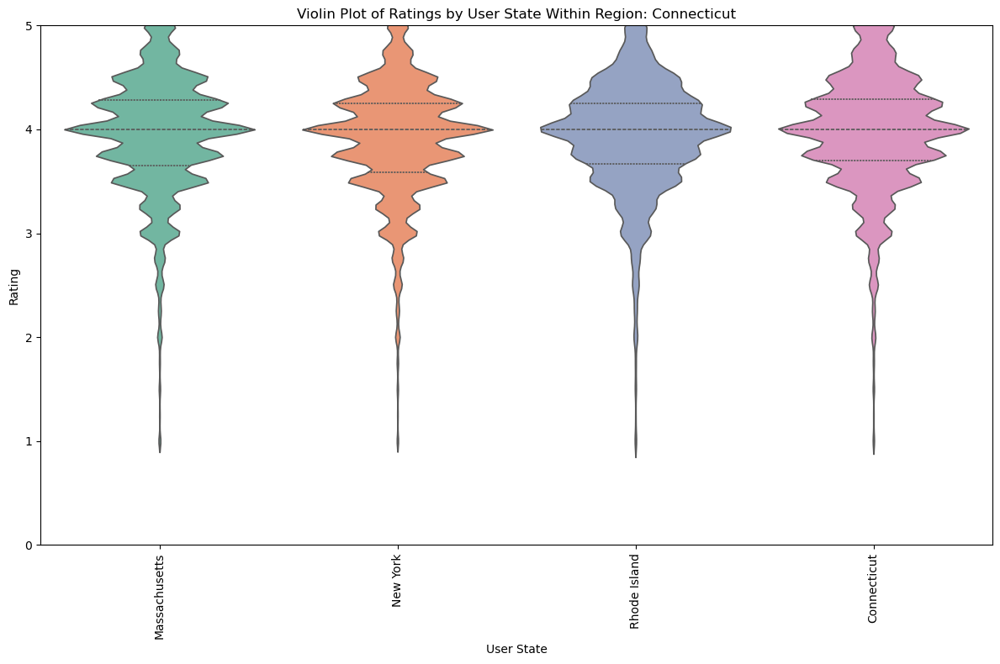

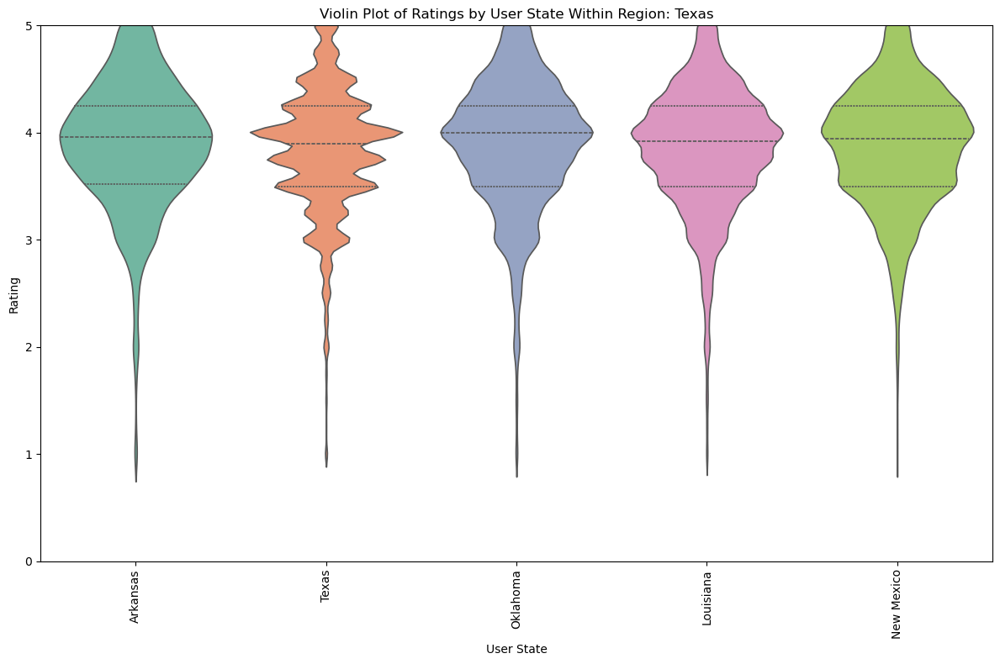

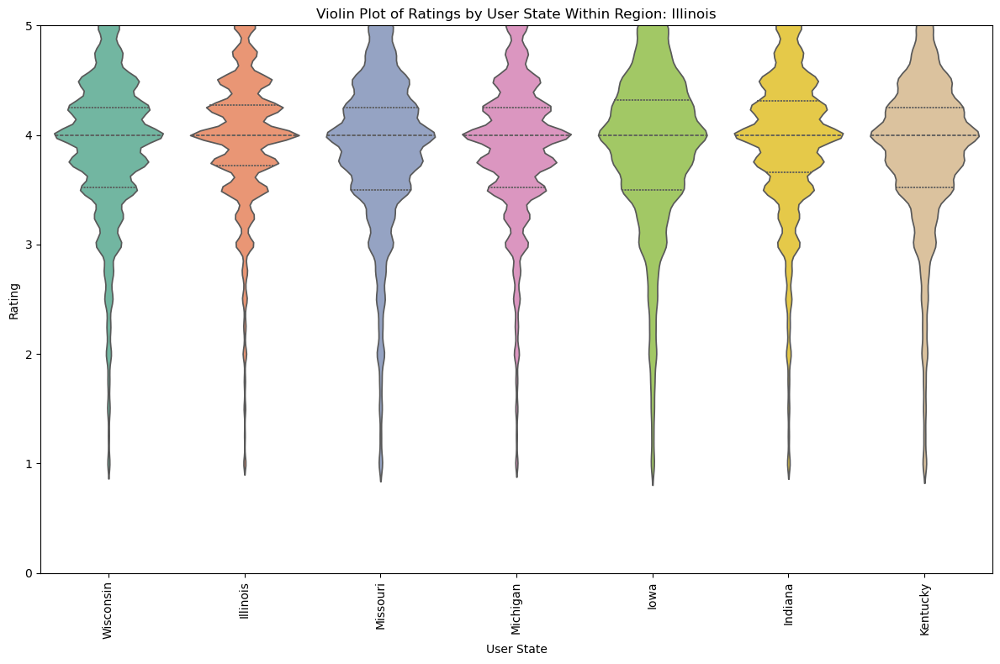

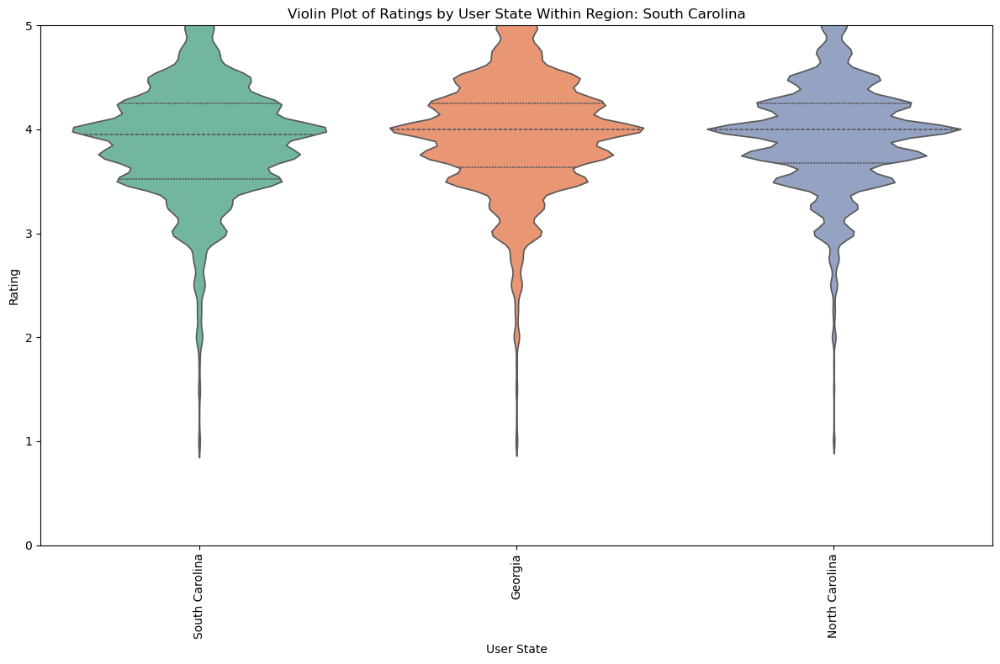

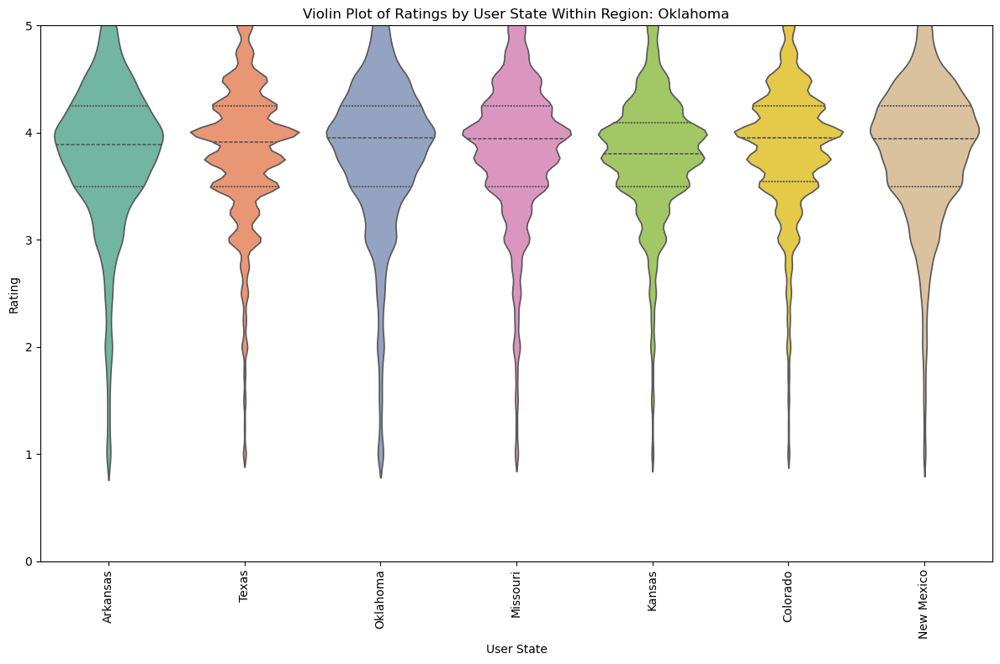

In [9]:
# Creating violin plot for each region displaying rating distributions for each user state in the region
unique_regions = ratings_df['region'].unique()

for region in unique_regions:
    subset_data = ratings_df[ratings_df['region'] == region]
    
    plt.figure(figsize=(12, 8))
    sns.violinplot(
        x='user_state',
        y='rating',
        data=subset_data,
        inner='quartile',
        palette='Set2',
        hue='user_state'
    )
    
    plt.title(f"Violin Plot of Ratings by User State Within Region: {region}")
    plt.xlabel("User State")
    plt.ylabel("Rating")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.ylim(0,5)
    plt.show()


In [10]:
def cohen_d(x, y):
    x = np.array(x, dtype=float)
    y = np.array(y, dtype=float)
    nx, ny = len(x), len(y)
    mean_x, mean_y = np.mean(x), np.mean(y)
    std_x, std_y = np.std(x, ddof=1), np.std(y, ddof=1) 
    pooled_std = np.sqrt(((nx - 1) * std_x ** 2 + (ny - 1) * std_y ** 2) / (nx + ny - 2))
    return (mean_x - mean_y) / pooled_std

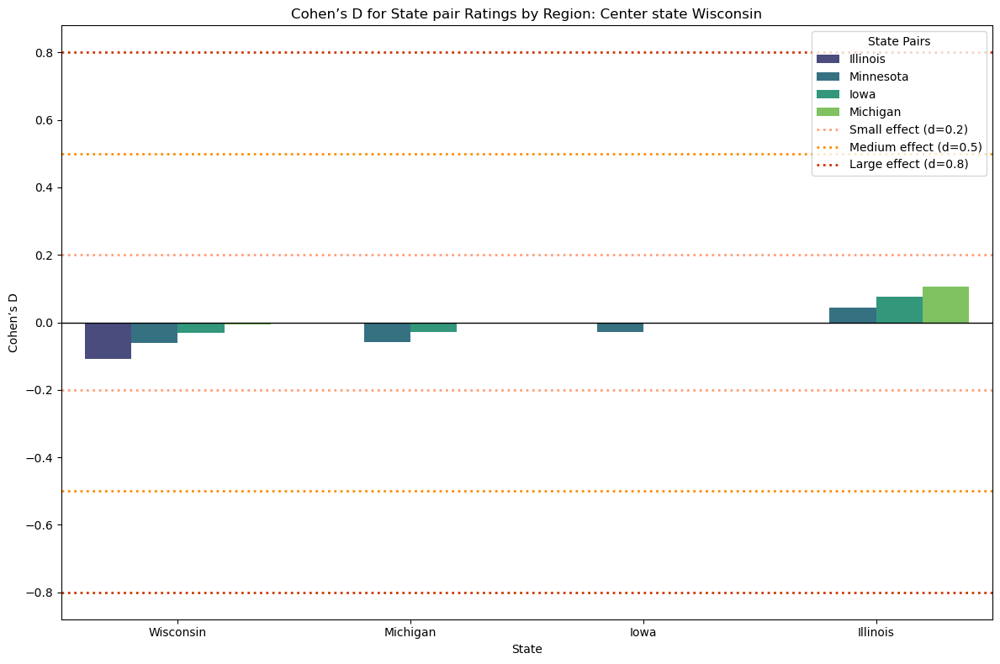

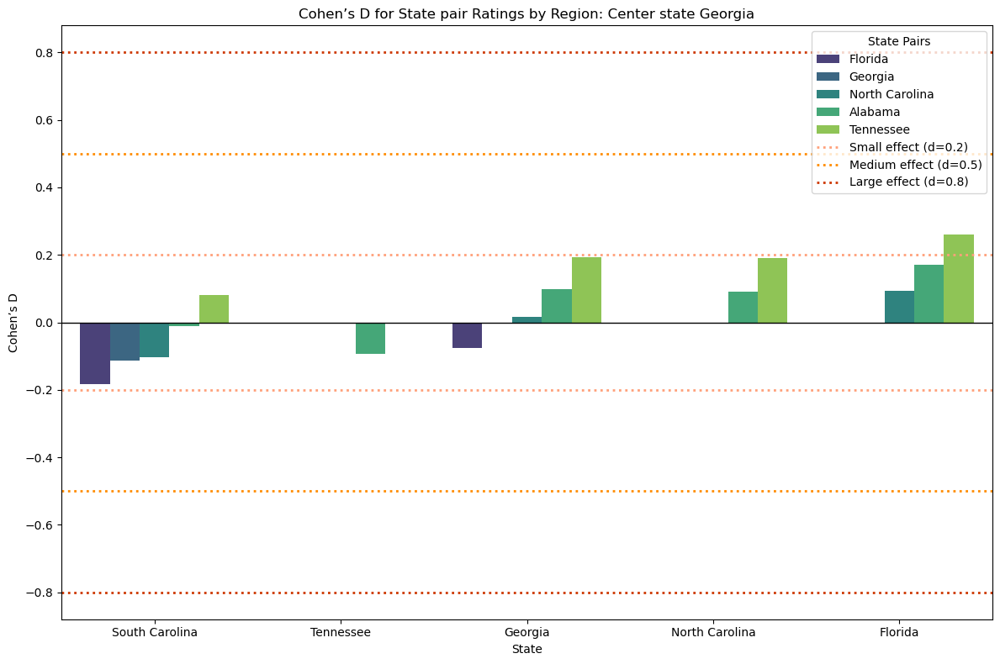

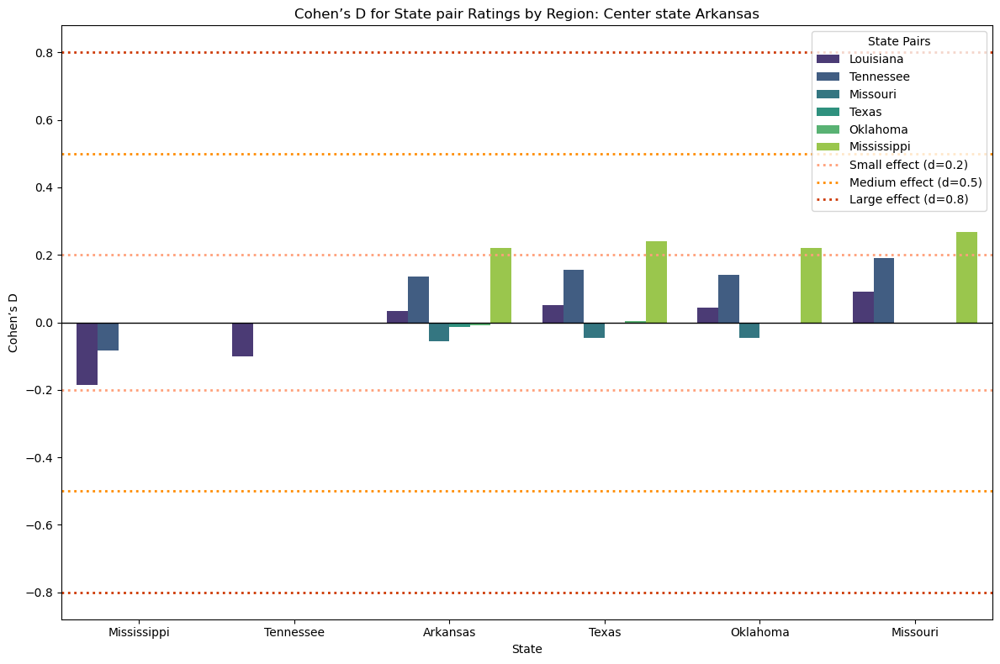

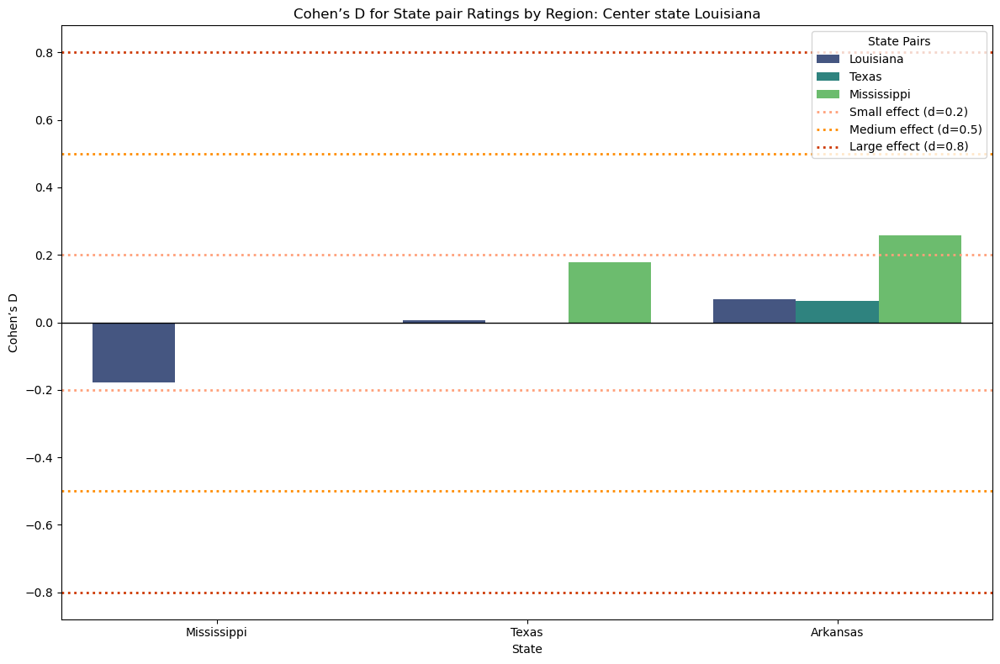

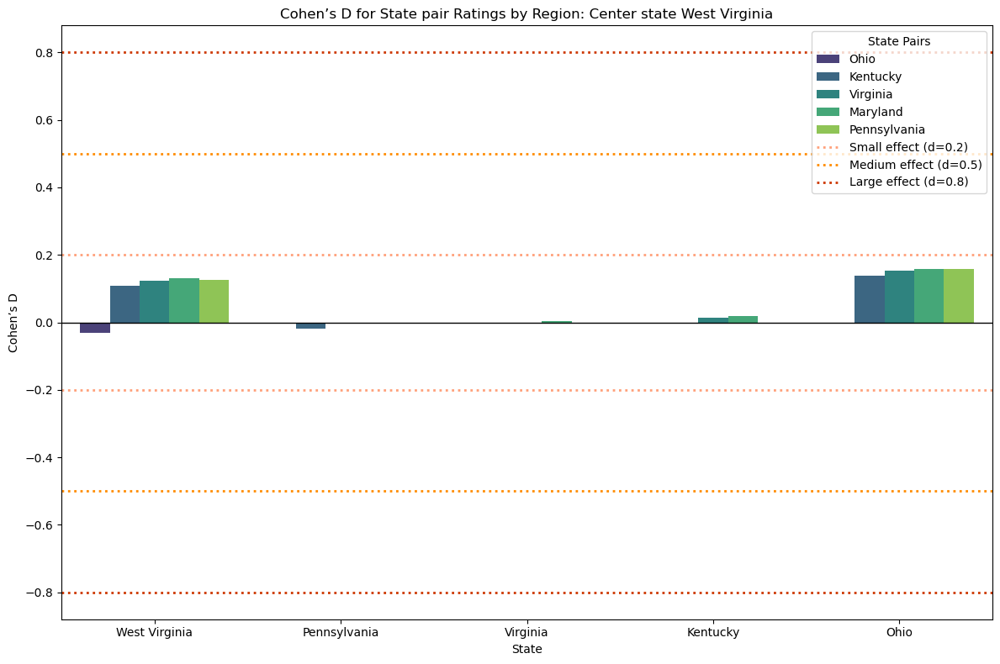

...

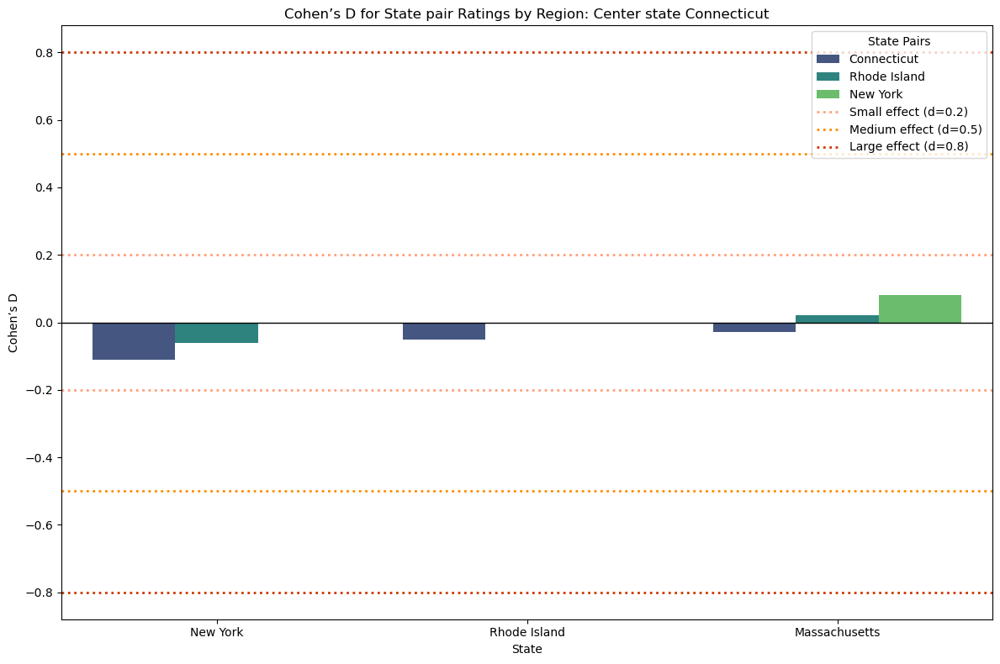

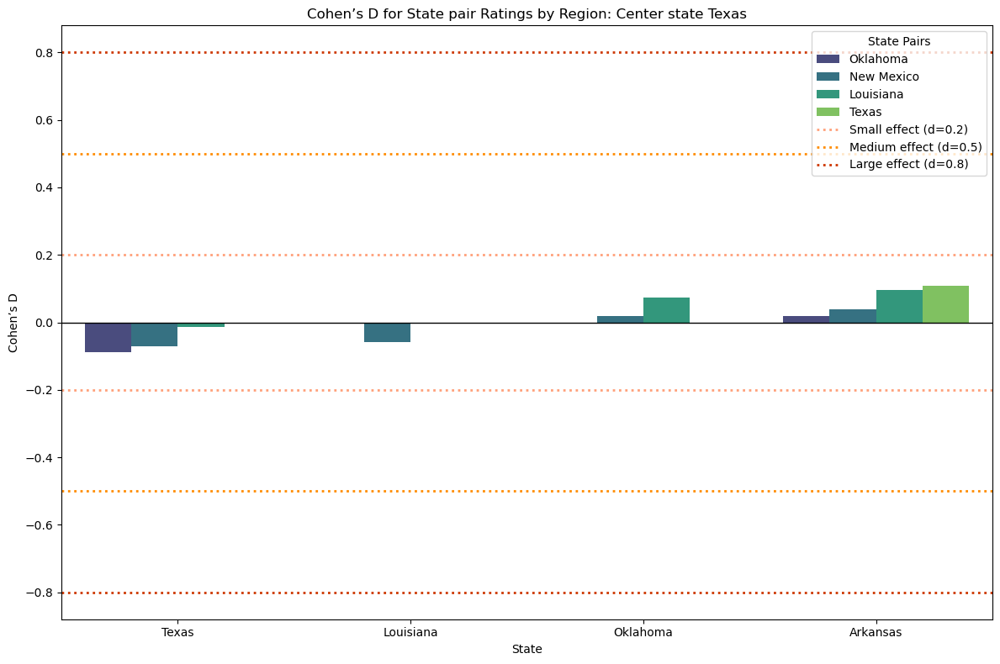

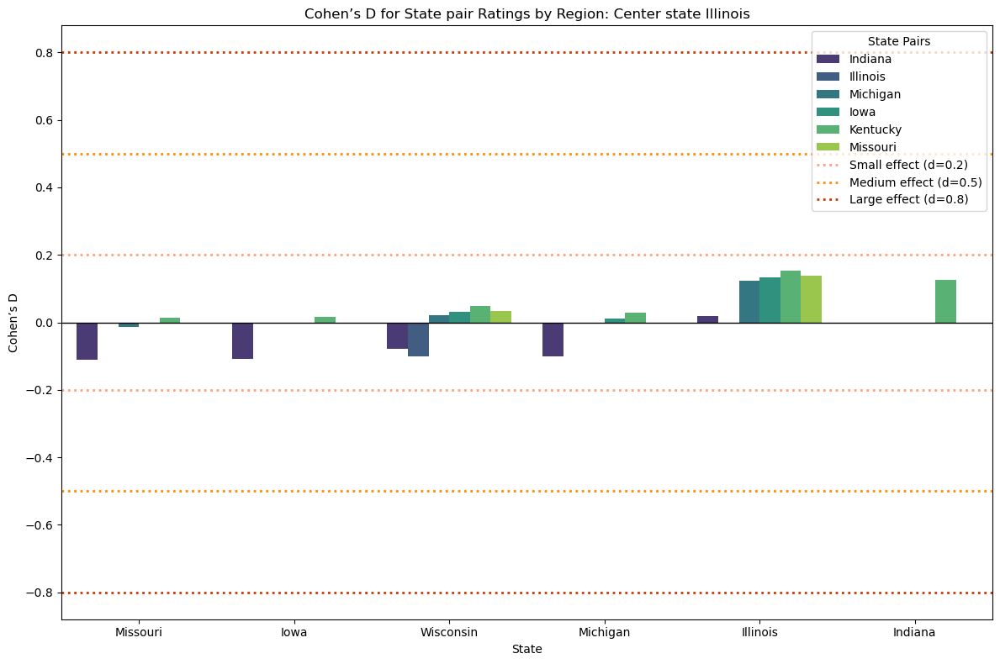

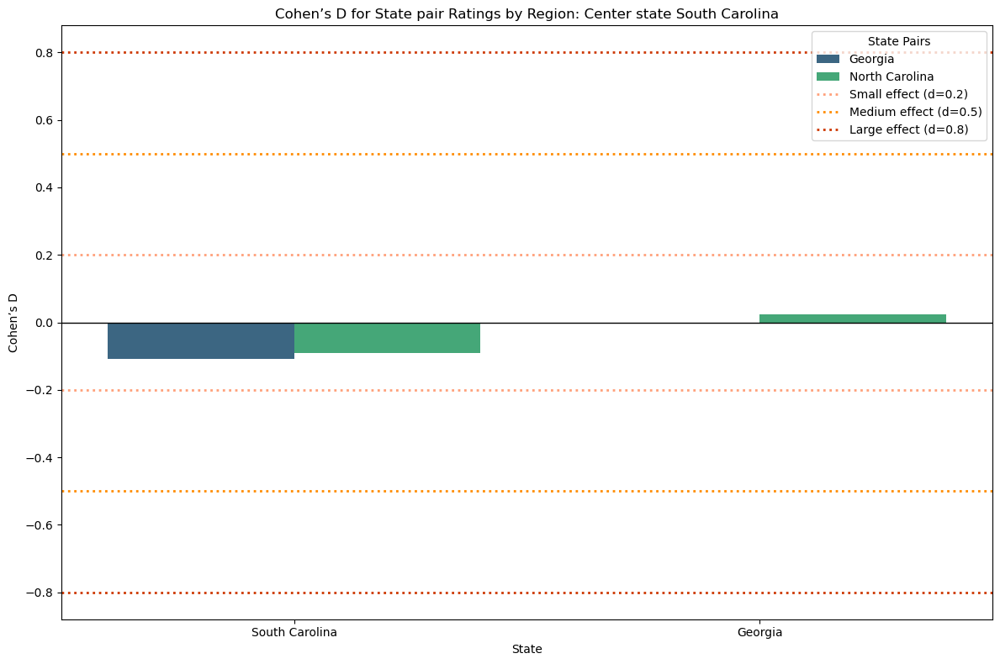

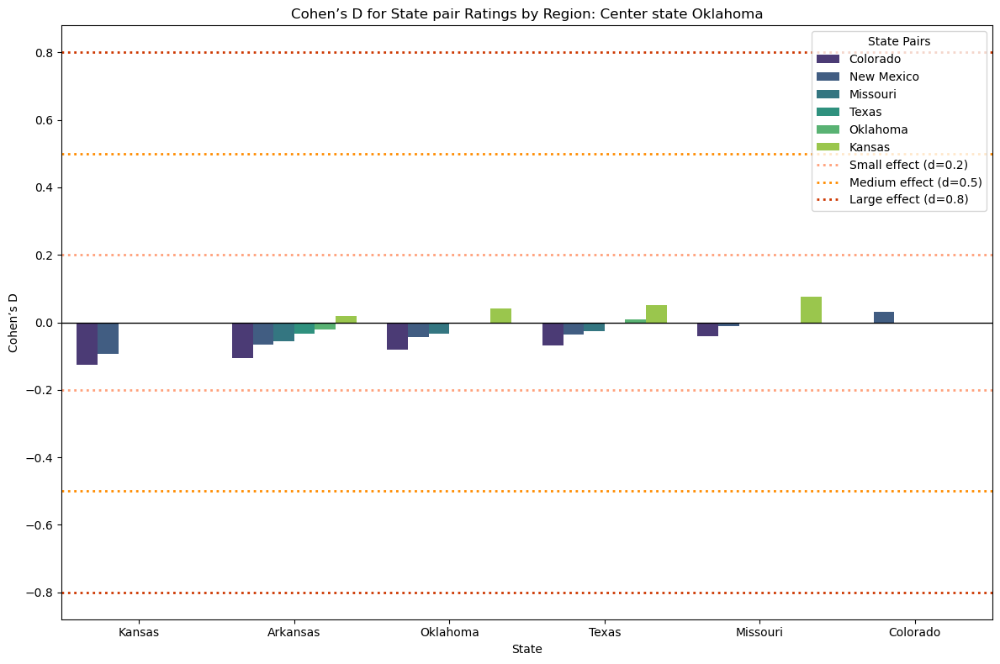

/tmp/ipykernel_1206397/372857616.py:63: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_cohen_df = pd.concat(all_cohen_results, ignore_index=True)


In [11]:
# Creating a plot of the Cohen's D values between every user_state of a region without calculating it twice.
all_cohen_results = []


for region in ratings_df['region'].unique():
    subset = ratings_df[ratings_df['region'] == region]
    cohen_results = []
    processed_pairs = set()
    
    for state1 in subset['user_state'].unique():
        for state2 in subset['user_state'].unique():
            if state1 != state2:
                state_pair = tuple(sorted([state1, state2]))
                
                if state_pair in processed_pairs:
                    continue
                
                ratings_state1 = subset[subset['user_state'] == state1]['rating']
                ratings_state2 = subset[subset['user_state'] == state2]['rating']
                
                if len(ratings_state1) == 0 or len(ratings_state2) == 0:
                    continue
                
                d_value = cohen_d(ratings_state1, ratings_state2)
                cohen_results.append((state1, state2, d_value, region))
                processed_pairs.add(state_pair)    
    
    cohen_df_region = pd.DataFrame(cohen_results, columns=['State1', 'State2', 'Cohen_d', 'Region'])
    
    cohen_df_region = cohen_df_region.sort_values(by='Cohen_d')
    
    all_cohen_results.append(cohen_df_region)


    
    plt.figure(figsize=(12, 8))
    sns.barplot(
        x='State1', 
        y='Cohen_d', 
        data=cohen_df_region, 
        palette='viridis', 
        hue='State2'
    )

    plt.axhline(y=0, color='black', linewidth=1)
    plt.axhline(y=0.2, color='#FFA07A', linestyle=':', linewidth=2, label='Small effect (d=0.2)')
    plt.axhline(y=-0.2, color='#FFA07A', linestyle=':', linewidth=2)
    plt.axhline(y=0.5, color='#FF8C00', linestyle=':', linewidth=2, label='Medium effect (d=0.5)')
    plt.axhline(y=-0.5, color='#FF8C00', linestyle=':', linewidth=2)
    plt.axhline(y=0.8, color='#CD3700', linestyle=':', linewidth=2, label='Large effect (d=0.8)')
    plt.axhline(y=-0.8, color='#CD3700', linestyle=':', linewidth=2)
    
    plt.xlabel('State')
    plt.ylabel('Cohen’s D')
    plt.title(f'Cohen’s D for State pair Ratings by Region: Center state {region}')
    plt.xticks(rotation=0)
    plt.legend(title='State Pairs', loc='upper right')
    plt.tight_layout()
    
    plt.show()
    

final_cohen_df = pd.concat(all_cohen_results, ignore_index=True)

In [12]:
final_cohen_df.head()

,State1,State2,Cohen_d,Region
0,Wisconsin,Illinois,-0.109529,Wisconsin
1,Wisconsin,Minnesota,-0.061605,Wisconsin
2,Michigan,Minnesota,-0.058442,Wisconsin
3,Wisconsin,Iowa,-0.031834,Wisconsin
4,Iowa,Minnesota,-0.028861,Wisconsin


In [25]:
michigan_rows = final_cohen_df[(final_cohen_df['State1'] == 'Missouri') | (final_cohen_df['State2'] == 'Missouri')]
michigan_rows

,State1,State2,Cohen_d,Region
28,Arkansas,Missouri,-0.056528,Arkansas
29,Texas,Missouri,-0.046513,Arkansas
30,Oklahoma,Missouri,-0.046008,Arkansas
37,Missouri,Louisiana,0.091351,Arkansas
41,Missouri,Tennessee,0.189659,Arkansas
45,Missouri,Mississippi,0.268916,Arkansas
161,Arkansas,Missouri,-0.042045,Missouri
164,Oklahoma,Missouri,-0.021886,Missouri
167,Missouri,Iowa,-0.003180,Missouri
174,Missouri,Nebraska,0.084094,Missouri


In [ ]:
# Sort the DataFrame by Cohen's d in ascending order
sorted_cohen_df = final_cohen_df.sort_values(by='Cohen_d')

state_groups = []
assigned_states = set()

for _, row in sorted_cohen_df.iterrows():
    if row['Cohen_d'] >= 2:
        continue

    state1 = row['State1']
    state2 = row['State2']

    # Skip if both states are already assigned
    if state1 in assigned_states and state2 in assigned_states:
        continue

    group_found = False

    # Check if either state is in any existing group
    for group in state_groups:
        if state1 in group['States'] or state2 in group['States']:
            if state1 not in group['States']:
                group['States'].append(state1)
                assigned_states.add(state1)
            if state2 not in group['States']:
                group['States'].append(state2)
                assigned_states.add(state2)
            
            group_found = True
            break

    # If no group was found, create a new one
    if not group_found:
        state_groups.append({'States': [state1, state2]})
        assigned_states.update([state1, state2])

print("State Groups:")
print("-" * 50)
for group in state_groups:
    states = ", ".join(group['States'])
    print(f"States: {states}")
    print("-" * 50)


State Groups:
--------------------------------------------------
States: Tennessee, Illinois, West Virginia, Virginia, Arkansas, Indiana, Ohio, Wisconsin, Michigan, Alabama
--------------------------------------------------
States: Pennsylvania, Vermont, Maine, New Jersey, New York, Massachusetts, Connecticut, New Hampshire, Rhode Island, Delaware, Maryland
--------------------------------------------------
States: South Dakota, Minnesota, Iowa, Wyoming, Idaho, Nebraska, Montana, North Dakota, Nevada
--------------------------------------------------
States: Kentucky, North Carolina
--------------------------------------------------
States: Mississippi, Missouri, Louisiana
--------------------------------------------------
States: Utah, Oklahoma, Kansas, Colorado, New Mexico, Texas, Arizona, California
--------------------------------------------------
States: South Carolina, Florida, Georgia
--------------------------------------------------
States: Washington, Oregon
----------------

In [16]:
state_groups = []  # Initialize an empty list to store state groups
assigned_states = set()  # Track states already grouped

# Loop through all rows in final_cohen_df
for _, row in final_cohen_df.iterrows():
    if row['Cohen_d'] >= 2:
        continue

    state1 = row['State1']
    state2 = row['State2']

    # Skip if both states are already assigned
    if state1 in assigned_states and state2 in assigned_states:
        continue

    group_found = False

    # Check if either state is in any existing group
    for group in state_groups:
        if state1 in group['States'] or state2 in group['States']:
            if state1 not in group['States']:
                group['States'].append(state1)
                assigned_states.add(state1)
            if state2 not in group['States']:
                group['States'].append(state2)
                assigned_states.add(state2)
            
            group_found = True
            break

    # If no group was found, create a new one
    if not group_found:
        state_groups.append({'States': [state1, state2]})
        assigned_states.update([state1, state2])

# Print results
print("State Groups:")
print("-" * 50)
for group in state_groups:
    states = ", ".join(group['States'])
    print(f"States: {states}")
    print("-" * 50)


State Groups:
--------------------------------------------------
States: Wisconsin, Illinois, Minnesota, Michigan, Iowa, Indiana
--------------------------------------------------
States: South Carolina, Florida, Georgia, North Carolina
--------------------------------------------------
States: Tennessee, Alabama
--------------------------------------------------
States: Mississippi, Louisiana
--------------------------------------------------
States: Arkansas, Missouri, Texas, Oklahoma, Utah, Kansas, Wyoming, Nebraska, New Mexico, Colorado
--------------------------------------------------
States: West Virginia, Ohio
--------------------------------------------------
States: Pennsylvania, Kentucky, Virginia, Maryland, Delaware, New Jersey
--------------------------------------------------
States: Oregon, Arizona, California, Nevada, Washington, Idaho
--------------------------------------------------
States: Maine, Vermont, Massachusetts, New Hampshire, New York, Connecticut, Rhode Is

In [18]:
import pprint

# Pretty print the state groups
pprint.pprint(state_groups)

[{'States': ['Wisconsin',
             'Illinois',
             'Minnesota',
             'Michigan',
             'Iowa',
             'Indiana']},
 {'States': ['South Carolina', 'Florida', 'Georgia', 'North Carolina']},
 {'States': ['Tennessee', 'Alabama']},
 {'States': ['Mississippi', 'Louisiana']},
 {'States': ['Arkansas',
             'Missouri',
             'Texas',
             'Oklahoma',
             'Utah',
             'Kansas',
             'Wyoming',
             'Nebraska',
             'New Mexico',
             'Colorado']},
 {'States': ['West Virginia', 'Ohio']},
 {'States': ['Pennsylvania',
             'Kentucky',
             'Virginia',
             'Maryland',
             'Delaware',
             'New Jersey']},
 {'States': ['Oregon',
             'Arizona',
             'California',
             'Nevada',
             'Washington',
             'Idaho']},
 {'States': ['Maine',
             'Vermont',
             'Massachusetts',
             'New Hampshire',


In [20]:
from collections import defaultdict

# List of all 50 U.S. states
us_states_list = [
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 
    'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 
    'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 
    'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 
    'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 
    'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 
    'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 
    'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 
    'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'
]

# Flatten the list of states and count occurrences
state_occurrences = defaultdict(int)
for group in state_groups:
    for state in group['States']:
        state_occurrences[state] += 1

# Identify states present in multiple groups
states_in_multiple_groups = {state for state, count in state_occurrences.items() if count > 1}

# Check for missing and extra states
grouped_states = set(state_occurrences.keys())
missing_states = set(us_states_list) - grouped_states
extra_states = grouped_states - set(us_states_list)

# Print results nicely
print("Summary of State Groups Check:")
print("-" * 40)

if missing_states:
    print("Missing States (not included in state_groups):")
    for state in sorted(missing_states):
        print(f" - {state}")
else:
    print("All 50 states are included in state_groups.")

print("\n" + "-" * 40)

if extra_states:
    print("Extra States (invalid entries in state_groups):")
    for state in sorted(extra_states):
        print(f" - {state}")
else:
    print("No extra states found in state_groups.")

print("\n" + "-" * 40)

if states_in_multiple_groups:
    print("States Present in Multiple Groups:")
    for state in sorted(states_in_multiple_groups):
        print(f" - {state}")
else:
    print("No states are present in multiple groups.")

print("-" * 40)


Summary of State Groups Check:
----------------------------------------
Missing States (not included in state_groups):
 - Alaska
 - Hawaii

----------------------------------------
No extra states found in state_groups.

----------------------------------------
No states are present in multiple groups.
----------------------------------------


Missing states: {'District of Columbia', 'Hawaii', 'Puerto Rico', 'Alaska'}


/tmp/ipykernel_1206397/3867649048.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  us_states['group'].fillna("No Data", inplace=True)


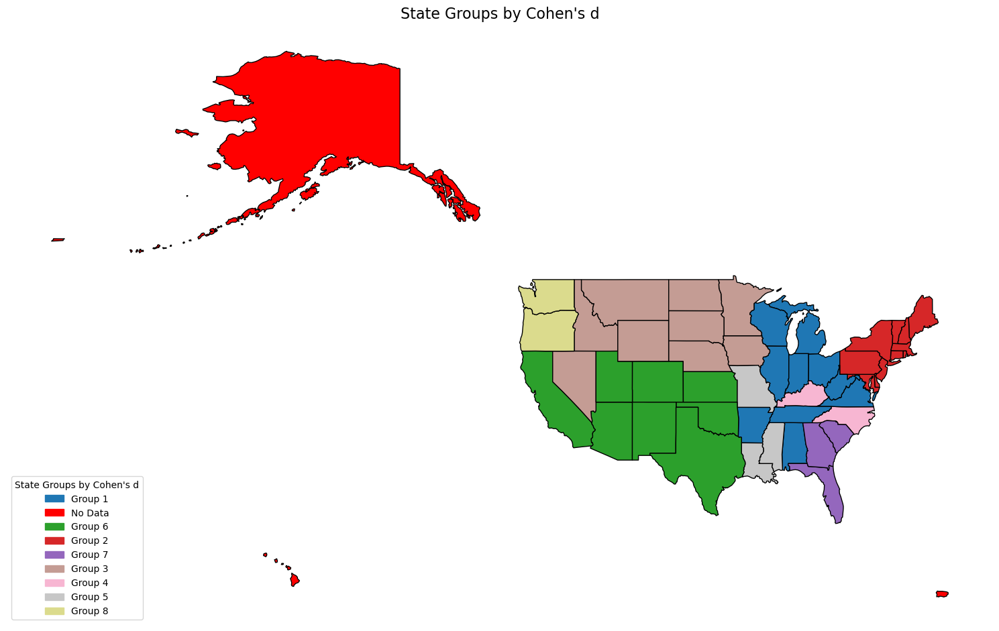

In [24]:
us_states = gpd.read_file("https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json")

# Flatten state_groups into a DataFrame
grouped_states = []
for idx, group in enumerate(state_groups):
    for state in group['States']:
        grouped_states.append({'user_state': state, 'group': f'Group {idx + 1}'})

# Convert to DataFrame
top_style_per_state = pd.DataFrame(grouped_states)

# Add missing states with 'No Data'
all_states = us_states['name'].unique()
matched_states = top_style_per_state['user_state'].unique()
missing_states = set(all_states) - set(matched_states)
print("Missing states:", missing_states)

# Add missing states as "No Data"
for state in missing_states:
    top_style_per_state = pd.concat([
        top_style_per_state,
        pd.DataFrame({'user_state': [state], 'group': ['No Data']})
    ], ignore_index=True)

# Merge with the GeoDataFrame
us_states = us_states.merge(
    top_style_per_state,
    left_on="name",
    right_on="user_state",
    how="left"
)

# Fill missing groups with "No Data"
us_states['group'].fillna("No Data", inplace=True)

# Map groups to colors
unique_groups = us_states['group'].unique()
group_colors = {
    group: plt.cm.tab20(i / len(unique_groups)) if group != "No Data" else "red"
    for i, group in enumerate(unique_groups)
}

# Assign colors to each state
us_states['color'] = us_states['group'].map(group_colors)

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
us_states.plot(
    ax=ax,
    color=us_states['color'],
    edgecolor='black'
)

# Create a legend for groups
legend_patches = [mpatches.Patch(color=color, label=group) for group, color in group_colors.items()]
ax.legend(handles=legend_patches, title="State Groups by Cohen's d", loc="lower left", fontsize=10)
ax.set_title("State Groups by Cohen's d", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()